# Detailed Examples Visualization

This notebook visualizes detailed analysis results for selected examples from the evaluation,
using existing plotting functions to show body parts and 3D axes.

In [5]:
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
from typing import Dict, List

import sys
sys.path.append("..")

# Import existing visualization functions
from src.visualization.cluster_visualization import create_viewpoint_visualization, create_3d_axes_visualization
from src.visualization.depth_visualization import visualize_depth_estimated_axes

# Import analysis modules
from src.data.cvat_loader import CVATLoader
from src.models.dinov2_extractor import DINOv2PatchExtractor, aggregate_depth_to_patches
from src.utils.analysis_utils import load_analysis_model
from src.utils.config import load_config
from src.classification.viewpoint_3d import estimate_viewpoint_with_axis_fitting

%matplotlib widget
plt.rcParams['figure.figsize'] = (12, 8)

print("Imports successful!")

Imports successful!


In [7]:
# Load evaluation results
EVALUATION_DIR = Path('../outputs/evaluation')  # Update path as needed
RESULTS_FILE = EVALUATION_DIR / 'detailed_results.json'
CONFIG_FILE = Path('../config.yaml')

with open(RESULTS_FILE, 'r') as f:
    results = json.load(f)

config = load_config(CONFIG_FILE)

print(f"Loaded {len(results)} evaluation results")
print(f"Configuration loaded from {CONFIG_FILE}")

Loaded 2847 evaluation results
Configuration loaded from ..\config.yaml


In [8]:
# Initialize models
dataset_root = Path(config['dataset']['root_path'])
crop_to_bbox = config['dataset'].get('crop_to_bbox', False)
loader = CVATLoader(dataset_root, crop_to_bbox=crop_to_bbox)

# Load feature extractor with depth
model_config = config['model']
extractor = DINOv2PatchExtractor(
    model_name=model_config['dinov2_model'],
    device=model_config['device'],
    image_size=model_config['image_size'],
    enable_depth=model_config.get('enable_depth', False),
    depth_dataset=model_config.get('depth_dataset', 'nyu')
)

# Load analysis method
analysis_config = config['analysis']
model_path = Path(analysis_config['output_dir']) / analysis_config['model_filename']
analysis_method = load_analysis_model(model_path)

# Load cluster labels
cluster_labels_config = config['cluster_labeling']
labels_file_path = cluster_labels_config['labels_file']
labels_file_full_path = Path(labels_file_path)
if not labels_file_full_path.is_absolute():
    labels_file_full_path = dataset_root / labels_file_path

with open(labels_file_full_path, 'r') as f:
    cluster_labels = json.load(f)

print(f"Models initialized successfully!")
print(f"Available body parts: {list(cluster_labels.keys())}")
print(f"Feature extractor: {model_config['dinov2_model']}")
print(f"Depth enabled: {extractor.enable_depth}")

Using cache found in C:\Users\Ted/.cache\torch\hub\facebookresearch_dinov2_main
C:\Users\Ted/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\swiglu_ffn.py:43: UserWarning: xFormers is available (SwiGLU)
  warnings.warn("xFormers is available (SwiGLU)")
C:\Users\Ted/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\attention.py:27: UserWarning: xFormers is available (Attention)
  warnings.warn("xFormers is available (Attention)")
C:\Users\Ted/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\block.py:33: UserWarning: xFormers is available (Block)
  warnings.warn("xFormers is available (Block)")


FileNotFoundError: Analysis model not found: outputs\analysis\kmeans30.npz

In [10]:
def select_examples(results: List[Dict], n_examples: int = 4) -> List[Dict]:
    """Select diverse examples for visualization."""
    by_iou = sorted([r for r in results if r['detection_iou'] is not None], 
                    key=lambda x: x['detection_iou'], reverse=True)
    by_confidence = sorted([r for r in results if r['viewpoint_confidence'] > 0], 
                          key=lambda x: x['viewpoint_confidence'], reverse=True)
    
    examples = []
    
    # Best detection
    if by_iou:
        examples.append(('Best Detection IoU', by_iou[0]))
    
    # Worst detection
    if by_iou:
        examples.append(('Worst Detection IoU', by_iou[-1]))
    
    # Correct viewpoint predictions
    correct_preds = [r for r in results if r['gt_viewpoint'] == r['predicted_viewpoint'] 
                     and r['gt_viewpoint'] != 'Unknown']
    if correct_preds:
        best_correct = max(correct_preds, key=lambda x: x['viewpoint_confidence'])
        examples.append(('Correct Viewpoint (High Conf)', best_correct))
    
    # Incorrect viewpoint predictions
    incorrect_preds = [r for r in results if r['gt_viewpoint'] != r['predicted_viewpoint'] 
                       and r['gt_viewpoint'] != 'Unknown']
    if incorrect_preds:
        worst_incorrect = max(incorrect_preds, key=lambda x: x['viewpoint_confidence'])
        examples.append(('Incorrect Viewpoint (High Conf)', worst_incorrect))
    
    return examples[:n_examples]

# Select examples
selected_examples = select_examples(results, n_examples=4)

print("Selected examples:")
for i, (title, result) in enumerate(selected_examples):
    print(f"  {i+1}. {title}")
    print(f"     Image: {Path(result['image_path']).name}")
    print(f"     GT: {result['gt_viewpoint']} | Pred: {result['predicted_viewpoint']}")
    print(f"     IoU: {result['detection_iou']:.3f} | Conf: {result['viewpoint_confidence']:.3f}")

Selected examples:
  1. Best Detection IoU
     Image: 2373_215_1_13.jpg
     GT: Right | Pred: Right
     IoU: 0.980 | Conf: 0.808
  2. Worst Detection IoU
     Image: HEAT-3-017-2017-EST-50-350-19.JPG
     GT: Left | Pred: Left
     IoU: 0.000 | Conf: 0.801
  3. Correct Viewpoint (High Conf)
     Image: ALMA-2-011-2011-EST-07-353-19.JPG
     GT: Right | Pred: Right
     IoU: 0.902 | Conf: 0.905
  4. Incorrect Viewpoint (High Conf)
     Image: ALMA-2-011-2011-EST-37-343-115.JPG
     GT: Left | Pred: Right
     IoU: 0.679 | Conf: 0.930


In [9]:
def process_single_example(result_data: Dict) -> Dict:
    """Process a single example through the full pipeline."""
    
    # Find corresponding annotation
    image_path = Path(result_data['image_path'])
    matching_annotation = None
    for annotation in loader.annotations:
        if annotation.image_path == image_path:
            matching_annotation = annotation
            break
    
    if matching_annotation is None:
        raise ValueError(f"Could not find matching annotation for {image_path}")
    
    # Load image
    image = loader.load_image(matching_annotation)
    
    # Extract features and depth
    patch_features, patch_coordinates, relative_patch_size, depth_map = extractor.extract_patch_features_with_depth(image)
    
    # Convert depth map to per-patch values
    patch_depths = None
    if depth_map is not None:
        patch_depths = aggregate_depth_to_patches(depth_map, patch_coordinates, relative_patch_size)
    
    # Get cluster assignments
    if hasattr(analysis_method, 'predict'):
        cluster_assignments = analysis_method.predict(patch_features)
    else:
        cluster_assignments = analysis_method.transform(patch_features)
    
    # Convert to cluster membership matrix
    n_clusters = analysis_method.get_n_components()
    patch_components = np.zeros((len(patch_features), n_clusters))
    
    if cluster_assignments.ndim == 1:
        for i, cluster_id in enumerate(cluster_assignments):
            if 0 <= cluster_id < n_clusters:
                patch_components[i, cluster_id] = 1.0
    else:
        patch_components = cluster_assignments
    
    # Perform viewpoint analysis
    viewpoint_result = None
    if patch_depths is not None:
        viewpoint_result = estimate_viewpoint_with_axis_fitting(
            patch_components=patch_components,
            patch_coordinates=patch_coordinates,
            patch_depths=patch_depths,
            cluster_labels=cluster_labels,
            image_size=image.size,
            forward_threshold=config.get('forward_threshold', 45.0),
            side_threshold=config.get('side_threshold', 75.0)
        )
    
    return {
        'image': image,
        'patch_coordinates': patch_coordinates,
        'patch_depths': patch_depths,
        'patch_components': patch_components,
        'relative_patch_size': relative_patch_size,
        'viewpoint_result': viewpoint_result,
        'result_data': result_data
    }

print("Processing function defined.")

Processing function defined.


D:\work\tech4conservation\hyena_dataset\images\SH_BrHy\SH0857\SH0857_BA52-229-2805XXE2505150.JPG
D:\work\tech4conservation\hyena_dataset\images\SH_BrHy\SH1882\SH1882_BA96-Y19-3005XXI__00088.JPG
D:\work\tech4conservation\hyena_dataset\images\SH_BrHy\SH0446\SH0446_BA32-26-2705XXI_00335a.JPG
D:\work\tech4conservation\hyena_dataset\images\SH_BrHy\SH0446\SH0446_BA32-26-2705XXI_00335a.JPG
D:\work\tech4conservation\hyena_dataset\images\SH_BrHy\SH0446\SH0446_BA32-26-2705XXI_00335a.JPG
D:\work\tech4conservation\hyena_dataset\images\SH_BrHy\SH1882\SH1882_BA96-Y19-3005XXI__00088.JPG


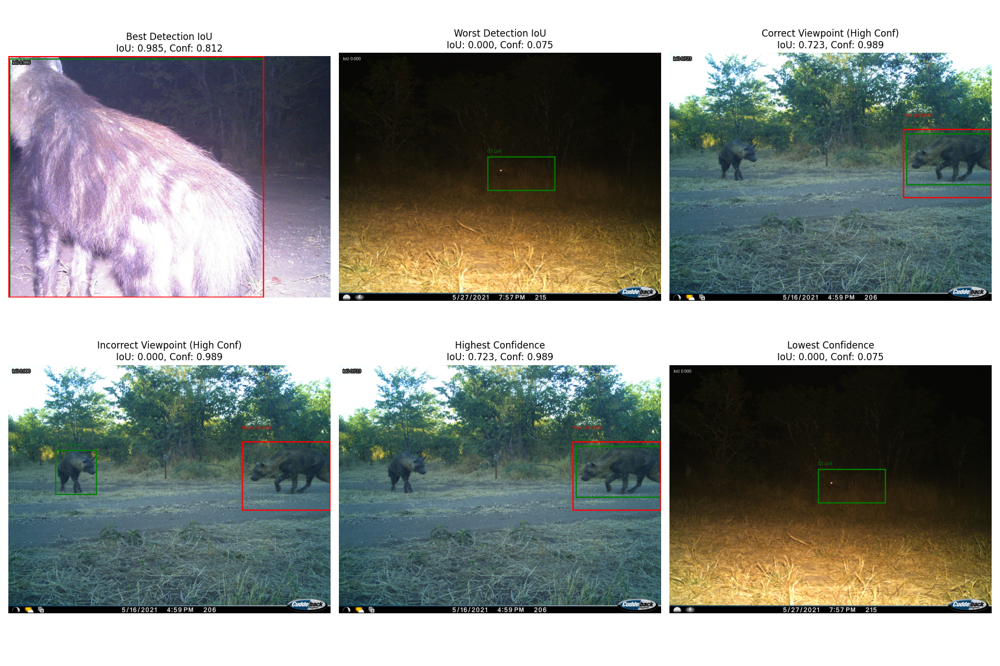


Legend:
  Green box: Ground truth bounding box
  Red box: Predicted bounding box
  GT: Ground truth viewpoint
  Pred: Predicted viewpoint (confidence)


In [10]:
from PIL import Image, ImageDraw, ImageFont
def draw_bbox_on_image(image_path: str, gt_bbox: List[float], pred_bbox: List[int], 
                      gt_viewpoint: str, pred_viewpoint: str, confidence: float, 
                      iou: float, max_size: int = 800) -> Image.Image:
    """Draw bounding boxes and labels on image."""
    # Load and resize image if needed
    print(image_path)
    image = Image.open(image_path).convert('RGB')
    
    # Resize if too large
    if max(image.size) > max_size:
        scale = max_size / max(image.size)
        new_size = (int(image.width * scale), int(image.height * scale))
        image = image.resize(new_size, Image.Resampling.LANCZOS)
        
        # Scale bounding boxes
        gt_bbox = [coord * scale for coord in gt_bbox]
        if pred_bbox:
            pred_bbox = [int(coord * scale) for coord in pred_bbox]
    
    # Create drawing context
    draw = ImageDraw.Draw(image)
    
    # Draw ground truth bbox in green
    if gt_bbox:
        draw.rectangle(gt_bbox, outline='green', width=3)
        draw.text((gt_bbox[0], gt_bbox[1] - 20), f'GT: {gt_viewpoint}', fill='green')
    
    # Draw predicted bbox in red
    if pred_bbox:
        draw.rectangle(pred_bbox, outline='red', width=3)
        draw.text((pred_bbox[0], pred_bbox[1] - 40), 
                 f'Pred: {pred_viewpoint} ({confidence:.2f})', fill='red')
    
    # Add IoU text
    draw.text((10, 10), f'IoU: {iou:.3f}', fill='white', stroke_width=2, stroke_fill='black')
    
    return image

# Select interesting examples to visualize
def select_examples(results: List[Dict], n_examples: int = 6) -> List[Dict]:
    """Select diverse examples for visualization."""
    # Sort by different criteria and pick examples
    by_iou = sorted([r for r in results if r['detection_iou'] is not None], 
                    key=lambda x: x['detection_iou'], reverse=True)
    by_confidence = sorted([r for r in results if r['viewpoint_confidence'] > 0], 
                          key=lambda x: x['viewpoint_confidence'], reverse=True)
    
    # Select examples: best IoU, worst IoU, high confidence correct, low confidence, etc.
    examples = []
    
    # Best detection
    if by_iou:
        examples.append(('Best Detection IoU', by_iou[0]))
    
    # Worst detection
    if by_iou:
        examples.append(('Worst Detection IoU', by_iou[-1]))
    
    # Correct viewpoint predictions
    correct_preds = [r for r in results if r['gt_viewpoint'] == r['predicted_viewpoint'] 
                     and r['gt_viewpoint'] != 'Unknown']
    if correct_preds:
        best_correct = max(correct_preds, key=lambda x: x['viewpoint_confidence'])
        examples.append(('Correct Viewpoint (High Conf)', best_correct))
    
    # Incorrect viewpoint predictions
    incorrect_preds = [r for r in results if r['gt_viewpoint'] != r['predicted_viewpoint'] 
                       and r['gt_viewpoint'] != 'Unknown']
    if incorrect_preds:
        worst_incorrect = max(incorrect_preds, key=lambda x: x['viewpoint_confidence'])
        examples.append(('Incorrect Viewpoint (High Conf)', worst_incorrect))
    
    # High confidence examples
    if by_confidence:
        examples.append(('Highest Confidence', by_confidence[0]))
    
    # Low confidence examples
    if by_confidence:
        examples.append(('Lowest Confidence', by_confidence[-1]))
    
    return examples[:n_examples]

# Visualize selected examples
examples = select_examples(results, n_examples=6)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for i, (title, result) in enumerate(examples):
    if i >= len(axes):
        break
    
    try:
        # Draw image with annotations
        annotated_image = draw_bbox_on_image(
            result['image_path'],
            result['gt_bbox'],
            result['predicted_bbox'],
            result['gt_viewpoint'],
            result['predicted_viewpoint'],
            result['viewpoint_confidence'],
            result['detection_iou']
        )
        
        # Display in subplot
        axes[i].imshow(annotated_image)
        axes[i].set_title(f'{title}\nIoU: {result["detection_iou"]:.3f}, Conf: {result["viewpoint_confidence"]:.3f}')
        axes[i].axis('off')
        
    except Exception as e:
        axes[i].text(0.5, 0.5, f'Error loading image:\n{str(e)}', 
                    ha='center', va='center', transform=axes[i].transAxes)
        axes[i].set_title(title)
        axes[i].axis('off')

# Hide unused subplots
for i in range(len(examples), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print("\nLegend:")
print("  Green box: Ground truth bounding box")
print("  Red box: Predicted bounding box")
print("  GT: Ground truth viewpoint")
print("  Pred: Predicted viewpoint (confidence)")


EXAMPLE 1: Best Detection IoU
Image: 2373_215_1_13.jpg
Ground Truth: Right | Predicted: Right
Detection IoU: 0.980 | Confidence: 0.808
Pipeline Result: Right (conf: 0.808)
Available Parts: 5 | Method: axis_fitting
Creating depth-enhanced axes visualization...


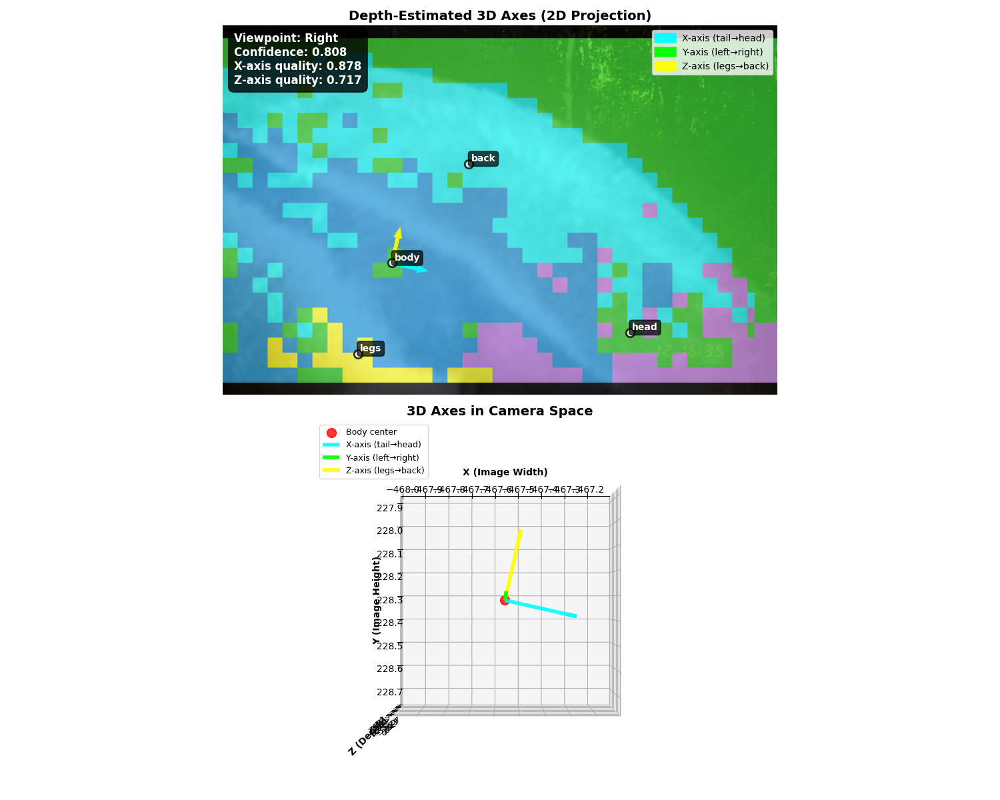

✓ Visualization complete for Best Detection IoU

EXAMPLE 2: Worst Detection IoU
Image: HEAT-3-017-2017-EST-50-350-19.JPG
Ground Truth: Left | Predicted: Left
Detection IoU: 0.000 | Confidence: 0.801
Pipeline Result: Left (conf: 0.801)
Available Parts: 6 | Method: axis_fitting
Creating depth-enhanced axes visualization...


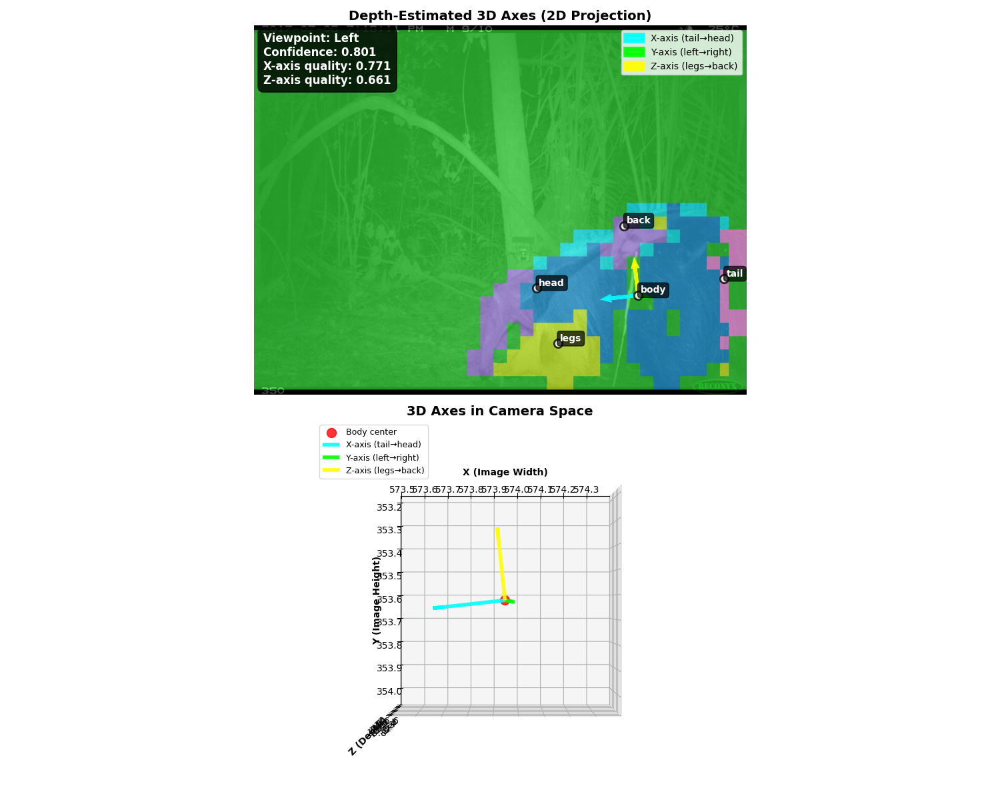

✓ Visualization complete for Worst Detection IoU

EXAMPLE 3: Correct Viewpoint (High Conf)
Image: ALMA-2-011-2011-EST-07-353-19.JPG
Ground Truth: Right | Predicted: Right
Detection IoU: 0.902 | Confidence: 0.905
Pipeline Result: Right (conf: 0.905)
Available Parts: 6 | Method: axis_fitting
Creating depth-enhanced axes visualization...


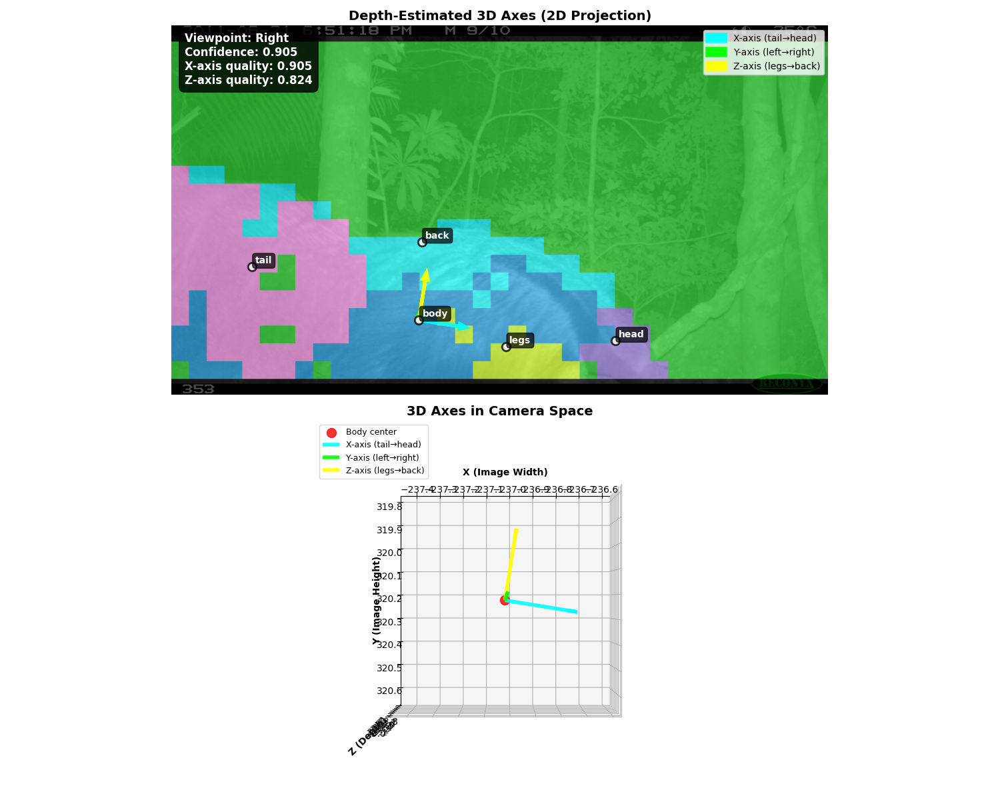

✓ Visualization complete for Correct Viewpoint (High Conf)

EXAMPLE 4: Incorrect Viewpoint (High Conf)
Image: ALMA-2-011-2011-EST-37-343-115.JPG
Ground Truth: Left | Predicted: Right
Detection IoU: 0.679 | Confidence: 0.930
Pipeline Result: Right (conf: 0.930)
Available Parts: 6 | Method: axis_fitting
Creating depth-enhanced axes visualization...


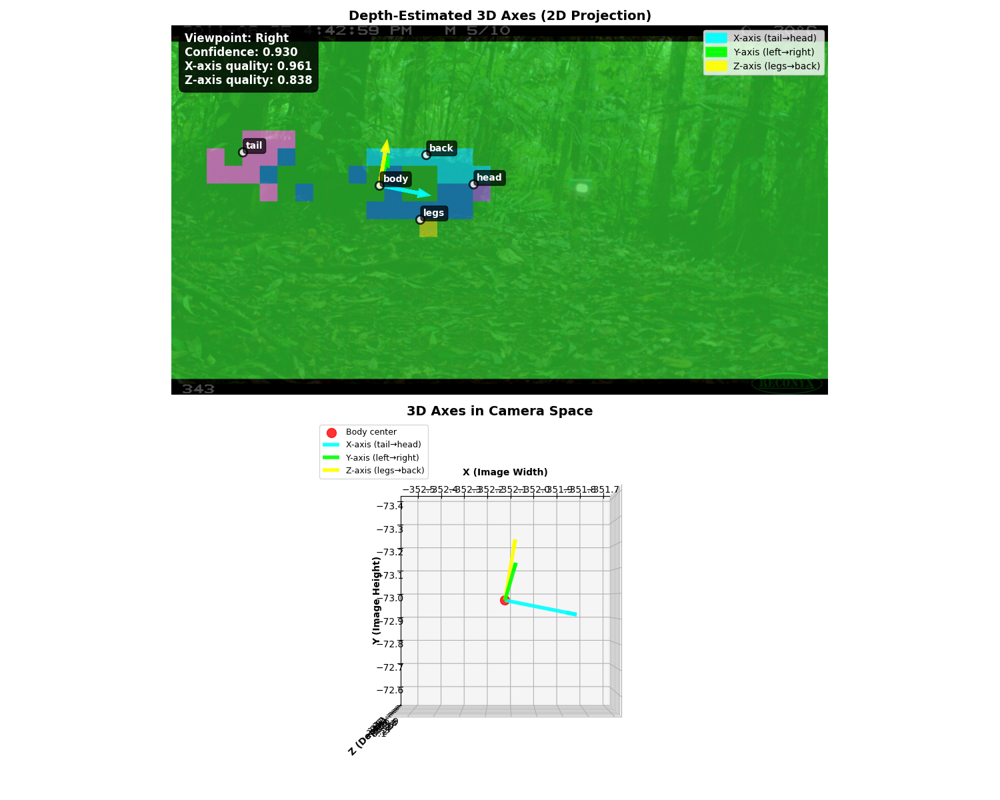

✓ Visualization complete for Incorrect Viewpoint (High Conf)

ALL EXAMPLES PROCESSED


In [11]:
# Process and visualize each example
for i, (title, result) in enumerate(selected_examples):
    print(f"\n{'='*60}")
    print(f"EXAMPLE {i+1}: {title}")
    print(f"{'='*60}")
    
    try:
        # Process example
        analysis = process_single_example(result)
        
        print(f"Image: {Path(result['image_path']).name}")
        print(f"Ground Truth: {result['gt_viewpoint']} | Predicted: {result['predicted_viewpoint']}")
        print(f"Detection IoU: {result['detection_iou']:.3f} | Confidence: {result['viewpoint_confidence']:.3f}")
        
        if analysis['viewpoint_result']:
            vr = analysis['viewpoint_result']
            print(f"Pipeline Result: {vr.get('viewpoint', 'Unknown')} (conf: {vr.get('confidence', 0):.3f})")
            print(f"Available Parts: {vr.get('available_parts', 0)} | Method: {vr.get('method', 'N/A')}")
        
        # Visualization 3: Depth-enhanced axes using existing function
        if analysis['patch_depths'] is not None and analysis['viewpoint_result']:
            print("Creating depth-enhanced axes visualization...")
            fig3 = visualize_depth_estimated_axes(
                image=analysis['image'],
                estimation_result=analysis['viewpoint_result'],
                patch_coordinates=analysis['patch_coordinates'],
                patch_depths=analysis['patch_depths'],
                patch_components=analysis['patch_components'],
                cluster_labels=cluster_labels,
                relative_patch_size=analysis['relative_patch_size'],
                figsize=(15, 12),
                axis_scale=120.0,
                show_3d_view=True
            )
            plt.show()
        
        print(f"✓ Visualization complete for {title}")
        
    except Exception as e:
        print(f"✗ Error processing {title}: {str(e)}")
        continue

print(f"\n{'='*60}")
print("ALL EXAMPLES PROCESSED")
print(f"{'='*60}")